# Model A Data Quality Check

`modelA_Data_preprocessing.ipynb`에서 Lane Ordering 결과를 실제 이미지에 시각화한 뒤, 일부 이미지가 일반적인 차량 전방 고정형 블랙박스 시점과 크게 다른 것을 확인하였다.

본 Notebook의 목적은 **Model A가 실제로 사용할 전방 고정형 블랙박스 입력 도메인과 시점이 충분히 유사한지를 확인하는 것**이다.

## Import

In [21]:
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

print("NumPy :", np.__version__)
print("Pandas:", pd.__version__)

NumPy : 2.4.6
Pandas: 3.0.5


## 경로 설정

현재 로컬 작업공간은 `C:/accident_ai`이며, 대용량 원본 데이터와 중간 산출물은 Git Repository 바깥의 `lane_data`, `outputs`에서 관리한다.

이번 Notebook은 `modelA_Data_preprocessing.ipynb`가 생성한 두 JSONL 파일을 입력으로 사용한다.

In [22]:
# 전체 로컬 작업공간
WORKSPACE_ROOT = Path(r"C:\accident_ai")

# 원본 이미지
IMAGE_ROOT = (
    WORKSPACE_ROOT
    / "lane_data"
    / "Training"
    / "image"
)

# 이전 Data Preprocessing Notebook에서 전달받는 입력
QUALITY_CHECK_INPUT_ROOT = (
    WORKSPACE_ROOT
    / "outputs"
    / "modelA_Data_Quality_check_inputs"
)

# 이번 Quality Check Notebook 자체 결과 저장 위치
QUALITY_CHECK_OUTPUT_ROOT = (
    WORKSPACE_ROOT
    / "outputs"
    / "modelA_Data_Quality_check_outputs"
)

QUALITY_CHECK_OUTPUT_ROOT.mkdir(
    parents=True,
    exist_ok=True
)

IMAGE_MANIFEST_PATH = (
    QUALITY_CHECK_INPUT_ROOT
    / "modelA_image_manifest.jsonl"
)

LANE_VECTOR_ORDERED_PATH = (
    QUALITY_CHECK_INPUT_ROOT
    / "modelA_lane_vector_ordered.jsonl"
)


for path_name, path in {
    "IMAGE_ROOT": IMAGE_ROOT,
    "IMAGE_MANIFEST_PATH": IMAGE_MANIFEST_PATH,
    "LANE_VECTOR_ORDERED_PATH": LANE_VECTOR_ORDERED_PATH,
}.items():
    if not path.exists():
        raise FileNotFoundError(
            f"{path_name} 경로가 없습니다: {path}"
        )


print("IMAGE_ROOT:")
print(IMAGE_ROOT)
print()
print("QUALITY_CHECK_INPUT_ROOT:")
print(QUALITY_CHECK_INPUT_ROOT)
print()
print("QUALITY_CHECK_OUTPUT_ROOT:")
print(QUALITY_CHECK_OUTPUT_ROOT)

IMAGE_ROOT:
C:\accident_ai\lane_data\Training\image

QUALITY_CHECK_INPUT_ROOT:
C:\accident_ai\outputs\modelA_Data_Quality_check_inputs

QUALITY_CHECK_OUTPUT_ROOT:
C:\accident_ai\outputs\modelA_Data_Quality_check_outputs


## Data Preprocessing 결과 Load

In [23]:
df_image_manifest = pd.read_json(
    IMAGE_MANIFEST_PATH,
    lines=True
)

df_lane_vector_ordered = pd.read_json(
    LANE_VECTOR_ORDERED_PATH,
    lines=True
)


print("Image Manifest shape:", df_image_manifest.shape)
print(
    "Image Manifest 고유 이미지:",
    df_image_manifest["file_name"].nunique()
)

print()

print(
    "Ordered Lane Vector shape:",
    df_lane_vector_ordered.shape
)
print(
    "Ordered Lane Vector 고유 이미지:",
    df_lane_vector_ordered["file_name"].nunique()
)

print()
print("[Image Manifest sample]")
display(df_image_manifest.head(10))

print("[Ordered Lane Vector sample]")
display(df_lane_vector_ordered.head(10))

Image Manifest shape: (15000, 10)
Image Manifest 고유 이미지: 15000

Ordered Lane Vector shape: (74542, 13)
Ordered Lane Vector 고유 이미지: 14856

[Image Manifest sample]


,file_name,image_size,annotation_count,traffic_lane_count,stop_line_count,crosswalk_count,has_traffic_lane,has_stop_line,has_crosswalk,annotation_type
0,13883084.jpg,"[1080, 1920]",8,8,0,0,True,False,False,lane
1,13883085.jpg,"[1080, 1920]",8,8,0,0,True,False,False,lane
2,13883471.jpg,"[1080, 1920]",8,8,0,0,True,False,False,lane
3,13883472.jpg,"[1080, 1920]",8,8,0,0,True,False,False,lane
4,13883473.jpg,"[1080, 1920]",8,8,0,0,True,False,False,lane
5,13883474.jpg,"[1080, 1920]",8,8,0,0,True,False,False,lane
6,13883475.jpg,"[1080, 1920]",8,8,0,0,True,False,False,lane
7,13883476.jpg,"[1080, 1920]",8,8,0,0,True,False,False,lane
8,13883477.jpg,"[1080, 1920]",8,8,0,0,True,False,False,lane
9,13883478.jpg,"[1080, 1920]",8,8,0,0,True,False,False,lane


[Ordered Lane Vector sample]


,file_name,image_size,lane_id,lane_order,lane_color,lane_type,category,x_data,y_data,point_count,lane_order_x,lane_order_y,lane_order_method
0,13883084.jpg,"[1080, 1920]",0,0,white,solid,polyline,"[207, 206, 480, 832]","[724, 723, 663, 584]",4,604.759494,635,common_y
1,13883084.jpg,"[1080, 1920]",1,1,white,dotted,polyline,"[909, 809]","[591, 651]",2,835.666667,635,common_y
2,13883084.jpg,"[1080, 1920]",7,2,white,solid,polyline,"[1022, 1145, 1263]","[589, 684, 778]",3,1081.557895,635,common_y
3,13883084.jpg,"[1080, 1920]",6,3,white,solid,polyline,"[1021, 1129, 1311]","[582, 653, 772]",3,1101.619718,635,common_y
4,13883084.jpg,"[1080, 1920]",5,4,white,solid,polyline,"[1678, 1274, 1035]","[739, 630, 568]",3,1292.532110,635,common_y
5,13883084.jpg,"[1080, 1920]",4,5,white,solid,polyline,"[1031, 1270, 1560, 1709]","[565, 623, 696, 731]",4,1317.671233,635,common_y
6,13883084.jpg,"[1080, 1920]",2,6,white,dotted,polyline,"[1162, 1561]","[578, 635]",2,1561.000000,635,common_y
7,13883084.jpg,"[1080, 1920]",3,7,white,solid,polyline,"[1194, 1547, 1853, 1908]","[571, 607, 640, 649]",4,1806.636364,635,common_y
8,13883085.jpg,"[1080, 1920]",0,0,white,solid,polyline,"[265, 499, 842]","[716, 658, 584]",3,531.445946,651,common_y
9,13883085.jpg,"[1080, 1920]",1,1,white,dotted,polyline,"[905, 703]","[600, 723]",2,821.243902,651,common_y


## 1. Near-field Lane Evidence 확인

본 프로젝트의 최종 입력은 차량에 고정된 전방 블랙박스 영상이다.

전방 블랙박스에서는 차량이 주행하는 도로의 Lane Boundary가 화면 하단의
ego vehicle 주변 영역까지 관찰되는 경우가 일반적이다.

따라서 먼저 각 traffic_lane annotation이 이미지의 아래쪽까지 얼마나
도달하는지를 확인한다.

각 Lane Boundary에 대해 가장 큰 y 좌표를 이미지 높이 H로 정규화하여
`bottom_y_ratio`를 계산한다.

- `bottom_y_ratio`가 1에 가까울수록 화면 아래쪽까지 Lane이 존재한다.
- 값이 작을수록 Lane이 원거리 영역에만 존재한다.

이 값 자체를 이미지 제거 기준으로 사용하지 않고,
향후 전방 블랙박스와 크게 다른 viewpoint를 탐색하기 위한 첫 번째
Quality Feature로 사용한다.

In [31]:
# ============================================================
# 1. Lane Boundary별 bottom_y_ratio 계산
# ============================================================

df_quality_lane = df_lane_vector_ordered.copy()


def get_image_height(image_size):
    """
    image_size = [H, W]
    """
    return float(image_size[0])


df_quality_lane["image_height"] = (
    df_quality_lane["image_size"]
    .apply(get_image_height)
)


# 각 Lane annotation이 화면 어디까지 내려오는지 확인
df_quality_lane["lane_bottom_y"] = (
    df_quality_lane["y_data"]
    .apply(max)
)


# 이미지 크기가 달라도 비교할 수 있도록 0~1로 정규화
df_quality_lane["bottom_y_ratio"] = (
    df_quality_lane["lane_bottom_y"]
    /
    df_quality_lane["image_height"]
)


display(
    df_quality_lane[
        [
            "file_name",
            "image_size",
            "lane_id",
            "lane_order",
            "lane_bottom_y",
            "bottom_y_ratio"
        ]
    ].head(20)
)

,file_name,image_size,lane_id,lane_order,lane_bottom_y,bottom_y_ratio
0,13883084.jpg,"[1080, 1920]",0,0,724,0.670370
1,13883084.jpg,"[1080, 1920]",1,1,651,0.602778
2,13883084.jpg,"[1080, 1920]",7,2,778,0.720370
3,13883084.jpg,"[1080, 1920]",6,3,772,0.714815
4,13883084.jpg,"[1080, 1920]",5,4,739,0.684259
5,13883084.jpg,"[1080, 1920]",4,5,731,0.676852
6,13883084.jpg,"[1080, 1920]",2,6,635,0.587963
7,13883084.jpg,"[1080, 1920]",3,7,649,0.600926
8,13883085.jpg,"[1080, 1920]",0,0,716,0.662963
9,13883085.jpg,"[1080, 1920]",1,1,723,0.669444


In [32]:
# ============================================================
# 2. Random Image 기준 bottom_y_ratio 확인
# ============================================================

RANDOM_SEED = 42
RANDOM_IMAGE_COUNT = 20


# 이미지 단위로 랜덤 선택
random_file_names = (
    df_quality_lane["file_name"]
    .drop_duplicates()
    .sample(
        n=RANDOM_IMAGE_COUNT,
        random_state=RANDOM_SEED
    )
    .tolist()
)


# 선택된 이미지에 속한 모든 Lane 확인
df_random_bottom_y = (
    df_quality_lane[
        df_quality_lane["file_name"].isin(
            random_file_names
        )
    ]
    .sort_values(
        ["file_name", "lane_order"]
    )
)


# 이미지별로 bottom_y_ratio 요약
df_random_bottom_y_summary = (
    df_random_bottom_y
    .groupby("file_name")
    .agg(
        lane_count=("lane_id", "count"),
        min_bottom_y_ratio=("bottom_y_ratio", "min"),
        median_bottom_y_ratio=("bottom_y_ratio", "median"),
        max_bottom_y_ratio=("bottom_y_ratio", "max")
    )
    .reset_index()
)


display(
    df_random_bottom_y_summary
)

,file_name,lane_count,min_bottom_y_ratio,median_bottom_y_ratio,max_bottom_y_ratio
0,13885220.jpg,7,0.638889,0.669444,0.725926
1,13888717.jpg,11,0.559259,0.564815,0.717593
2,13889122.jpg,15,0.537963,0.567593,0.718519
3,13896691.jpg,4,0.600926,0.691667,0.717593
4,13900839.jpg,15,0.547222,0.624074,0.817593
5,13901901.jpg,11,0.500000,0.554630,0.747222
6,13905802.jpg,3,0.718519,0.994444,0.998148
7,13947939.jpg,4,0.616667,0.729630,0.999074
8,13949487.jpg,4,0.763889,0.918519,0.983333
9,13950281.jpg,5,0.620370,0.757407,0.843519


In [39]:
# ============================================================
# 3. 전체 이미지 기준 bottom_y_ratio 요약
# ============================================================

df_bottom_y_summary = (
    df_quality_lane
    .groupby("file_name")
    .agg(
        lane_count=("lane_id", "count"),
        min_bottom_y_ratio=("bottom_y_ratio", "min"),
        median_bottom_y_ratio=("bottom_y_ratio", "median"),
        max_bottom_y_ratio=("bottom_y_ratio", "max")
    )
    .reset_index()
)


# min_bottom_y_ratio가 0.5보다 작은 이미지 집합
df_low_min_bottom = (
    df_bottom_y_summary[
        df_bottom_y_summary["median_bottom_y_ratio"] < 0.5
    ]
    .copy()
    .reset_index(drop=True)
)


print(
    "전체 Lane 이미지 수:",
    len(df_bottom_y_summary)
)

print(
    "min_bottom_y_ratio < 0.5 이미지 수:",
    len(df_low_min_bottom)
)

print(
    "비율:",
    round(
        len(df_low_min_bottom)
        / len(df_bottom_y_summary)
        * 100,
        2
    ),
    "%"
)


display(
    df_low_min_bottom.head(30)
)

전체 Lane 이미지 수: 14856
min_bottom_y_ratio < 0.5 이미지 수: 202
비율: 1.36 %


,file_name,lane_count,min_bottom_y_ratio,median_bottom_y_ratio,max_bottom_y_ratio
0,13896715.jpg,12,0.473148,0.492130,0.722222
1,14543727.jpg,1,0.465741,0.465741,0.465741
2,14543728.jpg,8,0.467593,0.476852,0.770370
3,14549529.jpg,1,0.490741,0.490741,0.490741
4,14549530.jpg,1,0.485185,0.485185,0.485185
5,14549531.jpg,2,0.477778,0.480556,0.483333
6,14549535.jpg,3,0.444444,0.455556,0.511111
7,14549536.jpg,2,0.450000,0.456481,0.462963
8,14549537.jpg,2,0.451852,0.459259,0.466667
9,14549538.jpg,2,0.451852,0.457870,0.463889


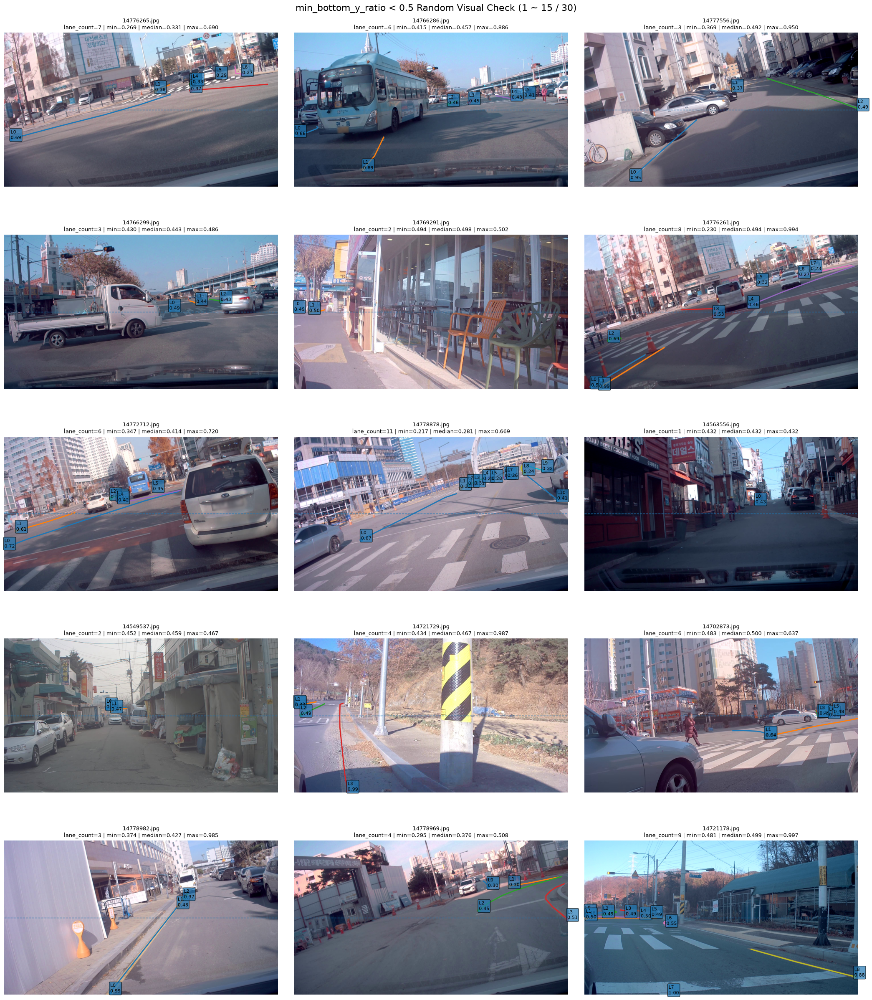

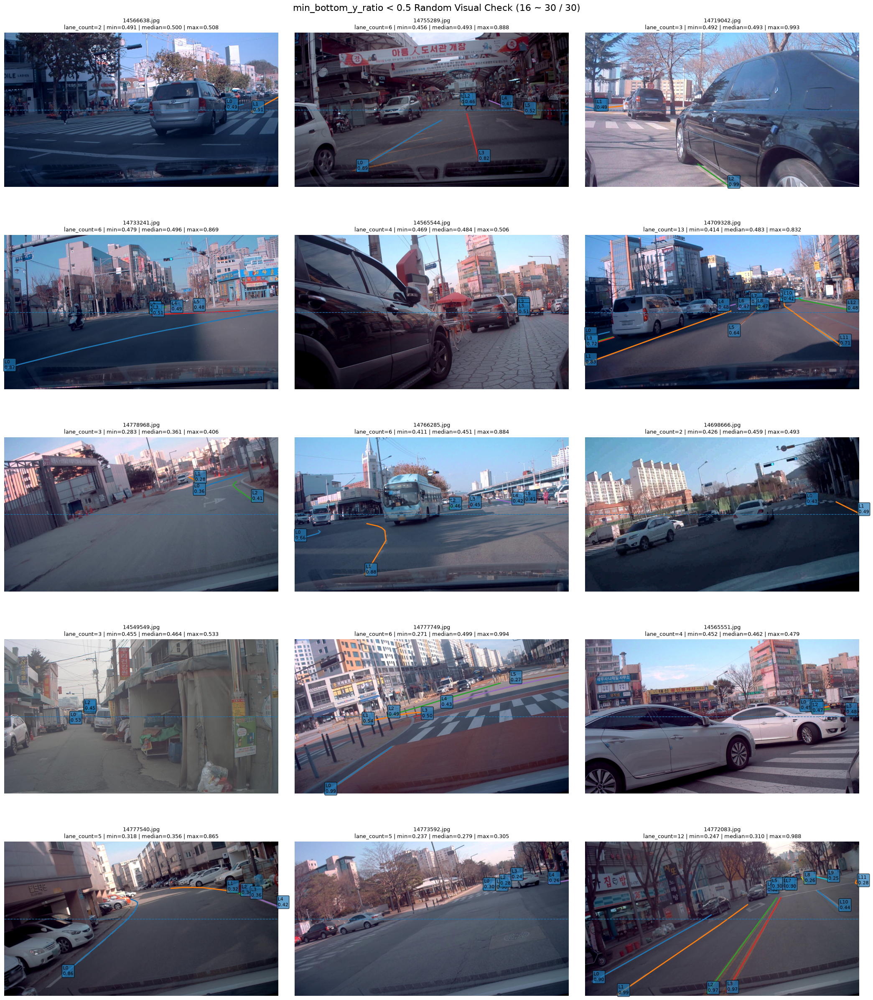

In [41]:
# ============================================================
# 4. min_bottom_y_ratio < 0.5 이미지 랜덤 30장 시각화
# ============================================================

import matplotlib.pyplot as plt


RANDOM_IMAGE_COUNT = 30


# random_state를 넣지 않는다.
# 셀을 다시 실행할 때마다 다른 30장이 선택된다.
df_low_min_sample = (
    df_low_min_bottom
    .sample(
        n=min(
            RANDOM_IMAGE_COUNT,
            len(df_low_min_bottom)
        )
    )
    .reset_index(drop=True)
)


sample_file_names = (
    df_low_min_sample["file_name"]
    .tolist()
)


# ------------------------------------------------------------
# 원본 이미지 경로 연결
# ------------------------------------------------------------

IMAGE_EXTENSIONS = {
    ".jpg",
    ".jpeg",
    ".png",
    ".bmp",
    ".webp"
}


image_paths = [
    path
    for path in IMAGE_ROOT.rglob("*")
    if (
        path.is_file()
        and path.suffix.lower() in IMAGE_EXTENSIONS
    )
]


image_path_by_name = {}

for image_path in image_paths:
    image_path_by_name.setdefault(
        image_path.name,
        image_path
    )


def visualize_low_bottom_image(
    file_name,
    ax
):
    # 해당 이미지의 Lane 전체
    frame_df = (
        df_quality_lane[
            df_quality_lane["file_name"] == file_name
        ]
        .sort_values("lane_order")
    )

    # 이미지 단위 Quality 값
    summary_row = (
        df_bottom_y_summary[
            df_bottom_y_summary["file_name"] == file_name
        ]
        .iloc[0]
    )

    image_path = image_path_by_name.get(
        str(file_name)
    )

    if image_path is None:
        ax.text(
            0.5,
            0.5,
            f"이미지를 찾지 못함\n{file_name}",
            ha="center",
            va="center",
            transform=ax.transAxes
        )

        ax.axis("off")
        return

    image = plt.imread(
        image_path
    )

    ax.imshow(
        image
    )


    # --------------------------------------------------------
    # Lane annotation 전체 표시
    # --------------------------------------------------------

    for row in frame_df.itertuples(
        index=False
    ):

        ax.plot(
            row.x_data,
            row.y_data,
            linewidth=2
        )

        # 각 Lane의 가장 아래쪽 위치 표시
        max_y = max(
            row.y_data
        )

        bottom_indices = [
            i
            for i, y
            in enumerate(row.y_data)
            if y == max_y
        ]

        bottom_x_values = [
            row.x_data[i]
            for i in bottom_indices
        ]

        bottom_x = float(
            np.median(
                bottom_x_values
            )
        )


        ax.scatter(
            bottom_x,
            max_y,
            s=25
        )


        ax.text(
            bottom_x,
            max_y,
            (
                f"L{int(row.lane_order)}\n"
                f"{row.bottom_y_ratio:.2f}"
            ),
            fontsize=8,
            bbox={
                "boxstyle": "round,pad=0.2",
                "alpha": 0.7
            }
        )


    # y/H = 0.5 기준선
    image_height = float(
        frame_df["image_height"].iloc[0]
    )

    half_y = (
        image_height * 0.5
    )

    ax.axhline(
        half_y,
        linestyle="--",
        linewidth=1
    )


    ax.set_title(
        f"{file_name}\n"
        f"lane_count={int(summary_row['lane_count'])} | "
        f"min={summary_row['min_bottom_y_ratio']:.3f} | "
        f"median={summary_row['median_bottom_y_ratio']:.3f} | "
        f"max={summary_row['max_bottom_y_ratio']:.3f}",
        fontsize=9
    )

    ax.axis("off")


# ------------------------------------------------------------
# 30장 = 5장씩 × 6행
# ------------------------------------------------------------

N_COLS = 3
N_ROWS = 5
IMAGES_PER_FIGURE = (
    N_COLS * N_ROWS
)


for start in range(
    0,
    len(sample_file_names),
    IMAGES_PER_FIGURE
):

    batch_file_names = (
        sample_file_names[
            start:
            start + IMAGES_PER_FIGURE
        ]
    )


    fig, axes = plt.subplots(
        N_ROWS,
        N_COLS,
        figsize=(21, 25)
    )


    axes = (
        np.array(axes)
        .reshape(-1)
    )


    for ax, file_name in zip(
        axes,
        batch_file_names
    ):

        visualize_low_bottom_image(
            file_name,
            ax
        )


    for ax in axes[
        len(batch_file_names):
    ]:
        ax.axis("off")


    fig.suptitle(
        (
            "min_bottom_y_ratio < 0.5 "
            f"Random Visual Check "
            f"({start + 1} ~ "
            f"{start + len(batch_file_names)} "
            f"/ {len(sample_file_names)})"
        ),
        fontsize=16
    )


    plt.tight_layout()
    plt.show()